In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import regex as re
import pickle as pkl
import seaborn as sns

from scipy import stats
from scipy.stats import cumfreq
import statsmodels.api as sm

from tabulate import tabulate
from scipy.stats import f

import os

In [2]:
os.chdir("/Users/avascharfstein/Desktop/Dartmouth/mds-final")

In [3]:
df = pd.read_csv('data/df_relabeled.csv')
with open('data/specific_stats.pkl', 'rb') as f:
    specific_stats = pkl.load(f)
with open('data/overall_stats.pkl', 'rb') as f:
    overall_stats = pkl.load(f)
with open('data/context_vars.pkl', 'rb') as f:
    context_vars = pkl.load(f)

stats_df = df.drop(columns = context_vars)

In [28]:
def dist_measures(dist):
    mean = np.mean(dist)
    median = np.median(dist)
    std = np.std(dist)
    if std==0:
        skew = 0
    else:
        skew = 3*(mean-median)/std
    return [mean, median, skew, std]

def plt_dist(df, var, xlabel= None):
    m_dist = df[df['men']][var]
    w_dist = df[~df['men']][var]
    [m_mean, m_median, m_skew, m_std] = dist_measures(m_dist)
    [w_mean, w_median, w_skew, w_std] = dist_measures(w_dist)
    metric = "Mean" # default metric is mean
    m_metric = m_mean
    w_metric = w_mean
    #Assume skewness is >0 since there will be no negative values (FOR NOW)
    if m_skew > .5 or w_skew >.5: # if one of the distributions is skewed heavily..
        metric = "Median"
        m_metric = m_median
        w_metric = w_median

    if xlabel is None:
        xlabel = var.replace("_"," ").title()

    sns.histplot(m_dist, alpha=0.6, label='Mens', color='skyblue')  # Replace 'blue' with 'skyblue'
    sns.histplot(w_dist, alpha=0.4, label='Womens', color='orange')  # Replace 'orange' with 'salmon'

    plt.axvline(m_metric, color='skyblue', linestyle='dashed', linewidth=3)
    plt.axvline(w_metric, color='orange', linestyle='dashed', linewidth=3)
    #plt.title("Dashed Line represents " + metric, fontsize=7)
    plt.suptitle("Histogram of " + var.replace("_", " ").title())
    plt.text(0.5, -0.15, f"Dashed Line represents {metric}", horizontalalignment='center', verticalalignment='center',
             transform=plt.gca().transAxes, fontdict={'fontsize': 8, 'fontstyle': 'italic'})
    plt.xlabel(xlabel)
    plt.ylabel("Matches")
    plt.legend(loc='upper right')
    plt.show()

    # plt.hist(m_dist, alpha=0.4, label='Mens', color = 'blue') #0d98ba
    # plt.hist(w_dist, alpha=0.4, label='Womens', color = 'orange') #7804b3
    
    # plt.axvline(m_metric, color = 'blue', linestyle='dashed', linewidth=2)
    # plt.axvline(w_metric, color='orange', linestyle='dashed', linewidth=2)
    # plt.title("Dashed Line represents "+metric, fontsize = 7)
    # plt.suptitle("Histogram of " +var.replace("_"," ").title())
    # plt.xlabel(xlabel)
    # plt.ylabel("Matches")
    # plt.legend(loc='upper right')
    # plt.show()

def plt_density(df, var, xlabel= None, t=False, f=False):
    m_dist = df[df['men']][var]
    w_dist = df[~df['men']][var]
    [m_mean, m_median, m_skew, m_std] = dist_measures(m_dist)
    [w_mean, w_median, w_skew, w_std] = dist_measures(w_dist)
    metric = "Mean" # default metric is mean
    m_metric = m_mean
    w_metric = w_mean
    #Assume skewness is >0 since there will be no negative values (FOR NOW)
    if m_skew > .5 or w_skew >.5: # if one of the distributions is skewed heavily..
        metric = "Median"
        m_metric = m_median
        w_metric = w_median
        
    t_stat, t_p_value = stats.ttest_ind(m_dist, w_dist)
    f_stat, f_p_value = stats.levene(m_dist, w_dist)

    if xlabel is None:
        xlabel = var.replace("_"," ").title()

    sns.kdeplot(m_dist, label='Mens', color='skyblue')  # Replace 'blue' with 'skyblue'
    sns.kdeplot(w_dist, label='Womens', color='orange')  # Replace 'orange' with 'salmon'

    plt.axvline(m_metric, color='skyblue', linestyle='dashed', linewidth=2)
    plt.axvline(w_metric, color='orange', linestyle='dashed', linewidth=2)
    #plt.title("Dashed Line represents " + metric, fontsize=7)
    plt.suptitle("Density of " + var.replace("_", " ").title())
    plt.text(0.5, -0.15, f"Dashed Line represents {metric}", horizontalalignment='center', verticalalignment='center',
             transform=plt.gca().transAxes, fontdict={'fontsize': 8, 'fontstyle': 'italic'})
    if t and f:
        plt.text(0.5, -0.2, f"T Statistic: {t_stat:.4f}, p-value: {t_p_value:.4f}", horizontalalignment='center', verticalalignment='center',
                transform=plt.gca().transAxes, fontdict={'fontsize': 8, 'fontstyle': 'italic'})
        plt.text(0.5, -0.25, f"F Statistic: {f_stat:.4f}, p-value: {f_p_value:.4f}", horizontalalignment='center', verticalalignment='center',
                transform=plt.gca().transAxes, fontdict={'fontsize': 8, 'fontstyle': 'italic'})
    elif t:
        plt.text(0.5, -0.2, f"T Statistic: {t_stat:.4f}, p-value: {t_p_value:.4f}", horizontalalignment='center', verticalalignment='center',
                transform=plt.gca().transAxes, fontdict={'fontsize': 8, 'fontstyle': 'italic'})
    elif f:
        plt.text(0.5, -0.2, f"F Statistic: {f_stat:.4f}, p-value: {f_p_value:.4f}", horizontalalignment='center', verticalalignment='center',
                transform=plt.gca().transAxes, fontdict={'fontsize': 8, 'fontstyle': 'italic'})
    plt.xlabel(xlabel)
    plt.ylabel("Proportion of Matches")
    plt.legend(loc='upper right')
    plt.show()

In [5]:
h = "_home"
a = "_away"

In [6]:
specific_stats.remove('rs')
specific_stats.remove('seed')
specific_stats.remove('win')

In [7]:
specific_stats

{'aces',
 'breakpoints_won',
 'double_faults',
 'errors',
 'first_serve_points_won',
 'first_serve_successful',
 'games_won',
 'max_games_in_a_row',
 'max_points_in_a_row',
 'points_won',
 'points_won_from_last_10',
 'second_serve_points_won',
 'second_serve_successful',
 'service_games_won',
 'service_points_lost',
 'service_points_won',
 'tiebreaks_won',
 'total_breakpoints',
 'unforced_errors',
 'winners'}

In [8]:
features_diff = []
for stat in specific_stats:
    stats_df[stat+"_diff"] = stats_df[stat+h]-stats_df[stat+a] # abs() commented out
    features_diff.append(stat+"_diff")

features_diff.append("avg_set_diff")

for x in [x for x in overall_stats if x not in ['match_length','sets','men']]:
    features_diff.append(x)


In [9]:
# Remove features whose mean and variance < 1
to_remove = []
for feature in specific_stats:
    ms = dist_measures(stats_df[feature+"_diff"])
    ms_h = dist_measures(stats_df[feature+h])
    ms_a = dist_measures(stats_df[feature+a])
    if ms_h[0] < 1 and ms_h[0] < 1 and ms_h[3] < 1 and ms_a[3] <1:
        # print(feature)
        # print(ms_h)
        # print(ms_a)
        # plt_dist(stats, feature+h)
        to_remove.append(feature+"_diff")
        print("Removed "+feature+"_diff")

features_diff = list(set(features_diff) - set(to_remove))

Removed tiebreaks_won_diff


In [10]:
features_diff_df = stats_df[features_diff]

In [11]:
features_diff_df.to_csv("data/features_diff_df.csv", index=False)

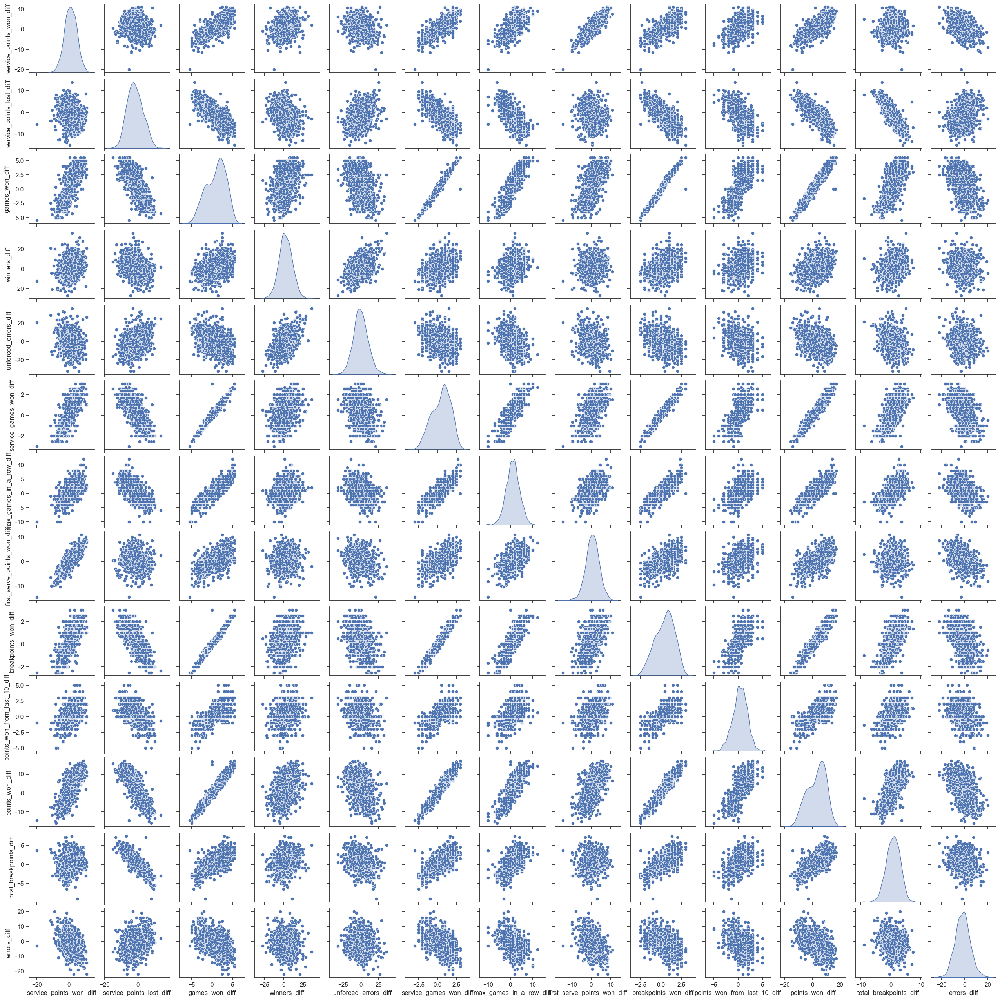

In [11]:
#features_diff_df.columns

# to_try = ['aces_diff','double_faults_diff','points_won_diff','avg_points_per_game','avg_game_length','groundstroke_errors_diff','service_games_won_diff','breakpoints_won_diff','backhand_winners_diff','forehand_winners_diff']
to_try = ['service_points_won_diff',
'service_points_lost_diff',
'games_won_diff',
'winners_diff',
'unforced_errors_diff',
'service_games_won_diff',
'max_games_in_a_row_diff',
'first_serve_points_won_diff',
'breakpoints_won_diff',
'points_won_from_last_10_diff',
'points_won_diff',
'total_breakpoints_diff',
'errors_diff']

sns.set(style="ticks")
sns.pairplot(features_diff_df[to_try], height=2, markers='o', diag_kind='kde')

# Show the plots
plt.show()


In [13]:
# for feature in features_diff:
#     plt_dist(stats_df, feature)

In [12]:
def plt_ecdf(df, var, xlabel=None):
    m_dist = df[df['men']][var]
    w_dist = df[~df['men']][var]

    ks = stats.kstest(m_dist, w_dist)

    m_x, m_cf = np.sort(m_dist), np.arange(1, len(m_dist) + 1) / len(m_dist)
    w_x, w_cf = np.sort(w_dist), np.arange(1, len(w_dist) + 1) / len(w_dist)

    if xlabel is None:
        xlabel = var.replace("_", " ").title()

    plt.step(x=m_x, y=m_cf, label='Mens', color='skyblue')
    plt.step(x=w_x, y=w_cf, label='Womens', color='orange')

    plt.title("Empirical CDF of " + var.replace("_", " ").title())
    plt.xlabel(xlabel)
    plt.ylabel("Cumulative Probability")
    plt.legend(loc='lower right')
    # Display KS test statistic and p-value
    plt.text(0.5, -0.15, f"KS Statistic: {ks.statistic:.4f}, p-value: {ks.pvalue:.4f}", horizontalalignment='center', verticalalignment='center',
             transform=plt.gca().transAxes, fontdict={'fontsize': 8, 'fontstyle': 'italic'})
    
    plt.show()


In [13]:
def summarize(df, var):
    m_dist = df[df['men']][var]
    w_dist = df[~df['men']][var]
    m_results = stats.describe(m_dist)
    w_results = stats.describe(w_dist)
    
    summary_data = [
        ["Mean", m_results.mean, w_results.mean],
        ["Median", np.median(m_dist), np.median(w_dist)],
        ["Variance", m_results.variance, w_results.variance],
        ["Skewness", m_results.skewness, w_results.skewness],
        ["Kurtosis", m_results.kurtosis, w_results.kurtosis],
    ]

    significant = []

    # KS-Test for distributions
    ks_stat, ks_p_value = stats.kstest(m_dist, w_dist)
    if ks_p_value <.05:
        significant.append("KS-Test")

    # T-test for means
    t_stat, t_p_value = stats.ttest_ind(m_dist, w_dist)
    if t_p_value < .05:
        significant.append("T-test")

    # Mann-Whitney U test (non-parametric test for comparing distributions)
    u_stat, mw_p_value = stats.mannwhitneyu(m_dist, w_dist)
    if mw_p_value < .05:
        significant.append("Mann-Whitney U")

    # F-test for variances
    f_stat, f_p_value = stats.levene(m_dist, w_dist)
    if f_p_value < .05:
        significant.append("Levene")

    
    if m_results.skewness >= .5 or m_results.skewness <= -.5:
        significant.append("M-Skew")
    if w_results.skewness >= .5 or w_results.skewness <= -.5:
        significant.append("W-Skew")

    # Results table
    results_table = [
        ["KS-test (Distribution)", ks_stat, ks_p_value],
        ["T-test (Means)", t_stat, t_p_value],
        ["Mann-Whitney U", u_stat, mw_p_value],
        ["Levene-test (Variances)", f_stat, f_p_value],
    ]
    
    var_format = var.replace("_"," ")
    # Print the tables
    print(f"Summary Statistics for {var_format.title()}:")
    print(tabulate(summary_data, headers=["Statistic", "Men", "Women"], tablefmt="grid"))
    print(tabulate(results_table, headers=["Test", "Statistic", "P-value"], tablefmt="grid"))
    print("Tests that are statistically significant:"+str(significant))
    print('\n\n')

def plt_qq(df, var, name):
    m_dist = df[df['men']][var]
    w_dist = df[~df['men']][var]


    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

    stats.probplot(m_dist, plot=axes[0])
    axes[0].set_title('Mens')
    axes[0].get_lines()[0].set_markeredgecolor('none')
    axes[0].get_lines()[0].set_markerfacecolor('skyblue')  # Set color for Men's QQ plot
    axes[0].get_lines()[1].set_color('black')  # Set color for the line


    stats.probplot(w_dist, plot=axes[1])
    axes[1].set_title('Womens')
    axes[1].get_lines()[0].set_markeredgecolor('none')
    axes[1].get_lines()[0].set_markerfacecolor('orange')  # Set color for Women's QQ plot
    axes[1].get_lines()[1].set_color('black')


    fig.suptitle(name)
    plt.show();

In [14]:
sorted(features_diff)

['aces_diff',
 'avg_game_length',
 'avg_points_per_game',
 'avg_set_diff',
 'avg_set_games',
 'avg_set_length',
 'breakpoints_won_diff',
 'double_faults_diff',
 'errors_diff',
 'first_serve_points_won_diff',
 'first_serve_successful_diff',
 'games_won_diff',
 'max_games_in_a_row_diff',
 'max_points_in_a_row_diff',
 'points_won_diff',
 'points_won_from_last_10_diff',
 'second_serve_points_won_diff',
 'second_serve_successful_diff',
 'service_games_won_diff',
 'service_points_lost_diff',
 'service_points_won_diff',
 'total_breakpoints_diff',
 'unforced_errors_diff',
 'winners_diff']

Summary Statistics for Aces Diff:
+-------------+-----------+------------+
| Statistic   |       Men |      Women |
+=============+===========+============+
| Mean        |  0.314079 |  0.376263  |
+-------------+-----------+------------+
| Median      |  0.25     |  0         |
+-------------+-----------+------------+
| Variance    |  4.04056  |  1.90084   |
+-------------+-----------+------------+
| Skewness    | -0.107005 | -0.0375009 |
+-------------+-----------+------------+
| Kurtosis    |  0.924199 |  1.82543   |
+-------------+-----------+------------+
+-------------------------+---------------+-------------+
| Test                    |     Statistic |     P-value |
+=========================+===============+=============+
| KS-test (Distribution)  |      0.12253  | 0.00148     |
+-------------------------+---------------+-------------+
| T-test (Means)          |     -0.552196 | 0.580945    |
+-------------------------+---------------+-------------+
| Mann-Whitney U          |

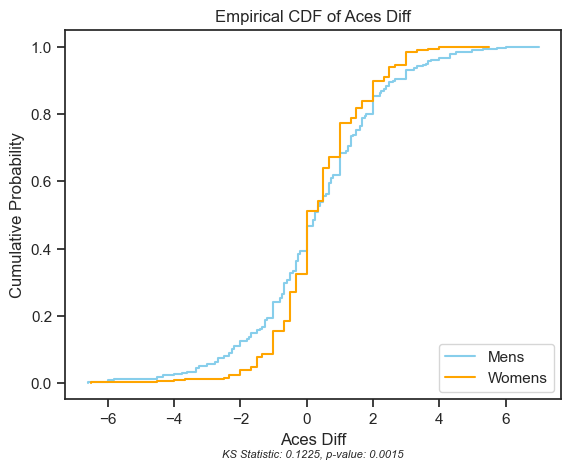

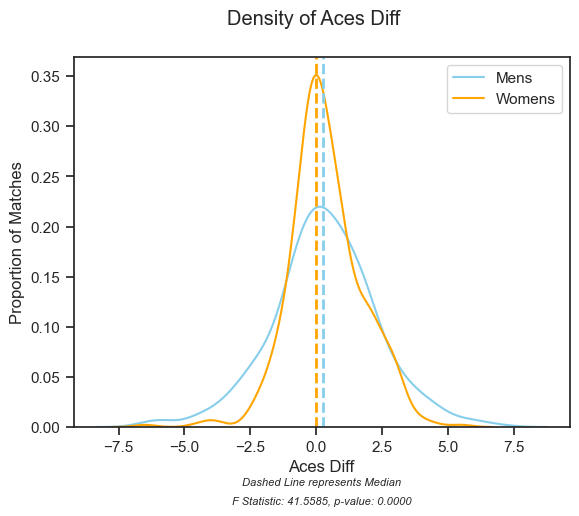

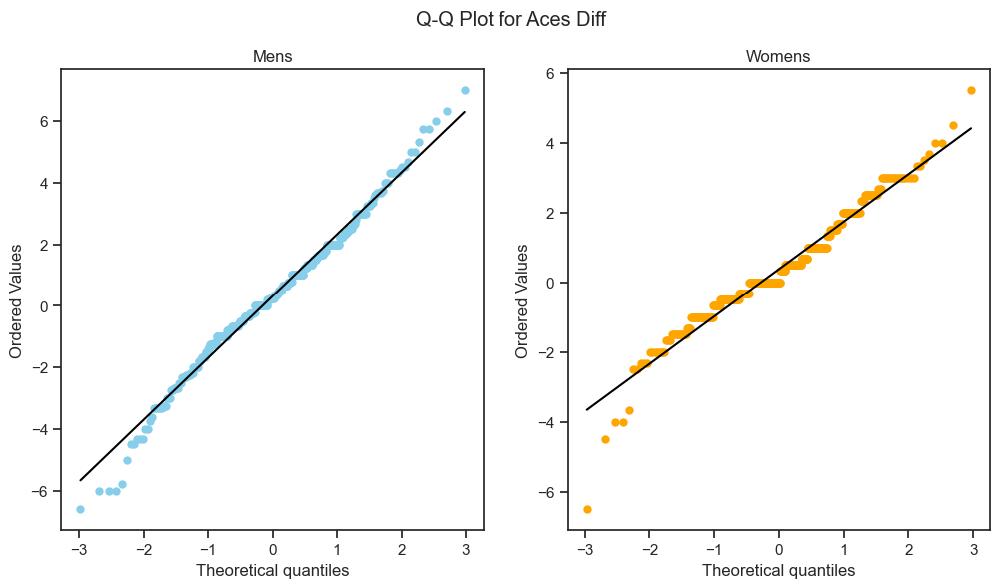

Summary Statistics for First Serve Points Won Diff:
+-------------+-----------+-----------+
| Statistic   |       Men |     Women |
+=============+===========+===========+
| Mean        |  0.569876 |  0.715368 |
+-------------+-----------+-----------+
| Median      |  0.666667 |  0.666667 |
+-------------+-----------+-----------+
| Variance    |  8.26192  | 14.861    |
+-------------+-----------+-----------+
| Skewness    | -0.121017 | -0.239936 |
+-------------+-----------+-----------+
| Kurtosis    |  0.137891 |  0.281001 |
+-------------+-----------+-----------+
+-------------------------+---------------+------------+
| Test                    |     Statistic |    P-value |
+=========================+===============+============+
| KS-test (Distribution)  |      0.119048 | 0.00221203 |
+-------------------------+---------------+------------+
| T-test (Means)          |     -0.659624 | 0.509656   |
+-------------------------+---------------+------------+
| Mann-Whitney U          | 1

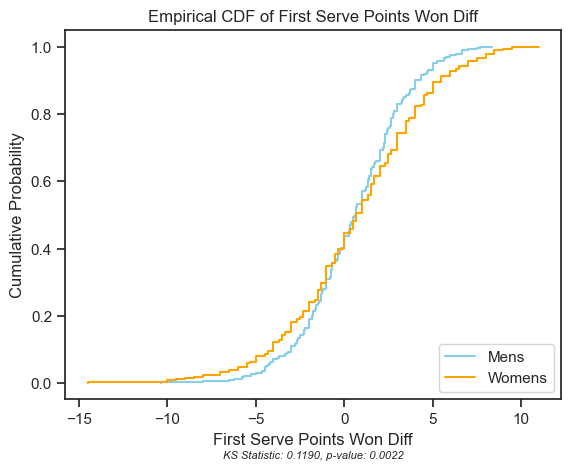

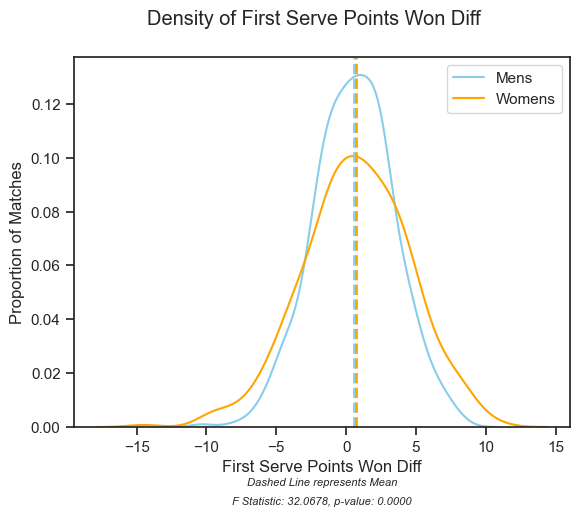

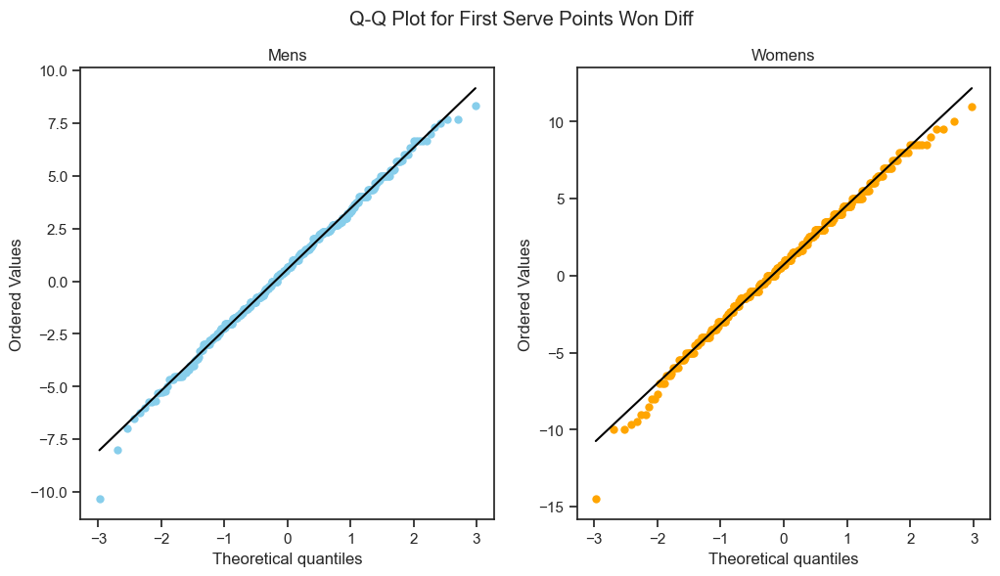

Summary Statistics for Unforced Errors Diff:
+-------------+------------+------------+
| Statistic   |        Men |      Women |
+=============+============+============+
| Mean        | -1.34838   |   0.600649 |
+-------------+------------+------------+
| Median      | -1.5       |   0.666667 |
+-------------+------------+------------+
| Variance    | 62.5339    | 139.128    |
+-------------+------------+------------+
| Skewness    | -0.0262045 |   0.111864 |
+-------------+------------+------------+
| Kurtosis    | -0.0141267 |  -0.159612 |
+-------------+------------+------------+
+-------------------------+--------------+-------------+
| Test                    |    Statistic |     P-value |
+=========================+==============+=============+
| KS-test (Distribution)  |      0.14841 | 5.18444e-05 |
+-------------------------+--------------+-------------+
| T-test (Means)          |     -2.99533 | 0.00281319  |
+-------------------------+--------------+-------------+
| Mann-Whi

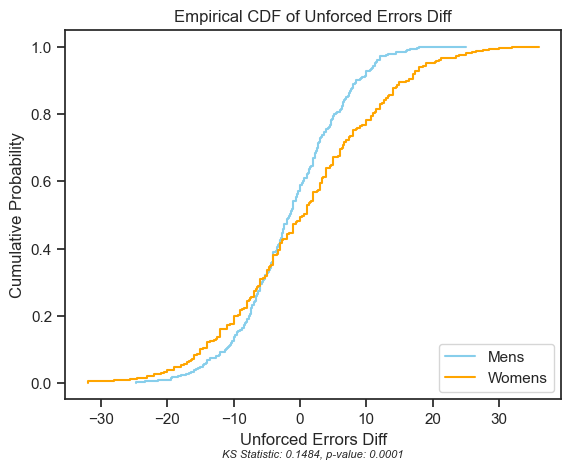

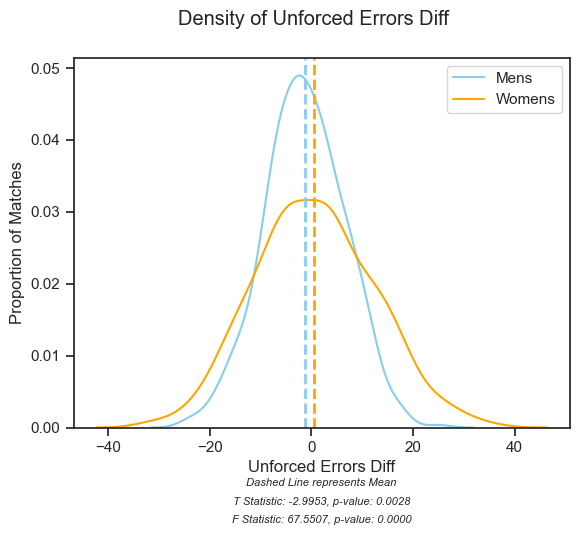

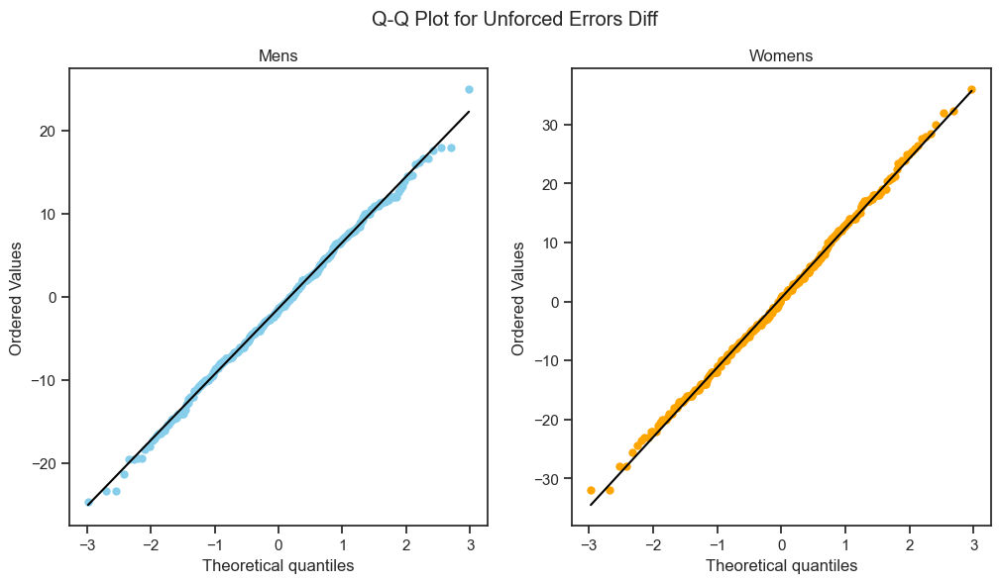

Summary Statistics for Winners Diff:
+-------------+------------+-----------+
| Statistic   |        Men |     Women |
+=============+============+===========+
| Mean        |  1.39396   |  3.47583  |
+-------------+------------+-----------+
| Median      |  1.33333   |  3.5      |
+-------------+------------+-----------+
| Variance    | 52.1145    | 97.7876   |
+-------------+------------+-----------+
| Skewness    |  0.0926633 | -0.105201 |
+-------------+------------+-----------+
| Kurtosis    |  0.130854  |  0.12338  |
+-------------+------------+-----------+
+-------------------------+--------------+-------------+
| Test                    |    Statistic |     P-value |
+=========================+==============+=============+
| KS-test (Distribution)  |     0.193488 | 3.21864e-08 |
+-------------------------+--------------+-------------+
| T-test (Means)          |    -3.70784  | 0.000221226 |
+-------------------------+--------------+-------------+
| Mann-Whitney U          | 947

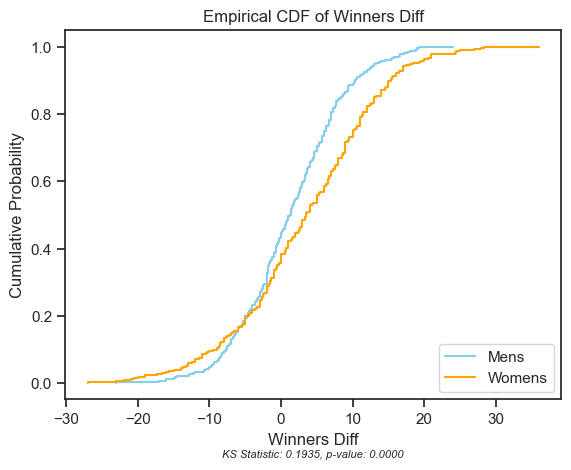

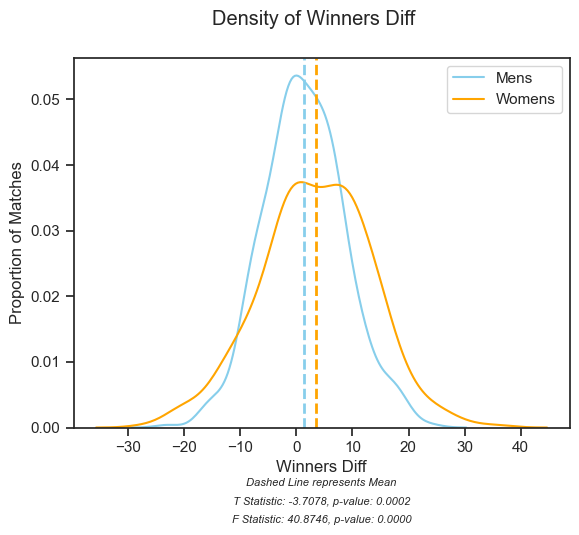

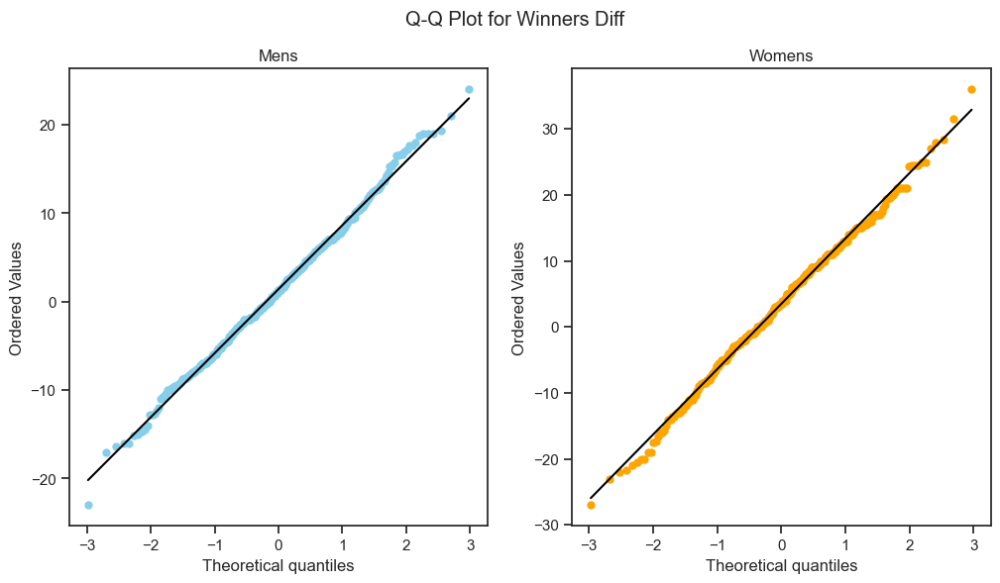

In [29]:
# Diff: unforced errors, winners, aces, first serve points won (didnt discuss), 

#total breakpoints, total unforced errors, points per game, game length, total first serve points, total second serve points won, total service games won, total aces
levene_only = ['aces_diff','first_serve_points_won_diff']
for feature in sorted(levene_only):
    summarize(stats_df,feature)
    plt_ecdf(stats_df, feature)
    plt_density(stats_df, feature, f=True)
    plt_qq(stats_df, feature, "Q-Q Plot for "+feature.replace("_"," ").title())

levene_and_t = ['unforced_errors_diff','winners_diff']
for feature in sorted(levene_and_t):
    summarize(stats_df,feature)
    plt_ecdf(stats_df, feature)
    plt_density(stats_df, feature, f=True, t=True)
    plt_qq(stats_df, feature, "Q-Q Plot for "+feature.replace("_"," ").title())

In [17]:
# for feature in sorted(features_diff):
#     summarize(stats_df,feature)
#     plt_ecdf(stats_df, feature)
#     plt_dist(stats_df, feature)
#     plt_qq(stats_df, feature, "Q-Q Plot for "+feature.replace("_"," ").title())

In [15]:
to_drop = []
for feature in features_diff:
    if "diff" not in feature:
        to_drop.append(feature)

diff_only = features_diff_df.drop(columns = to_drop)

In [19]:
# diff_only = diff_only.applymap(np.sign)
# diffs_sum = np.sum(diff_only, axis = 1)
# diff_only['men'] = stats_df['men']
# diff_only['win_home'] = stats_df['win_home']
# diff_only.groupby(['men','win_home']).sum()

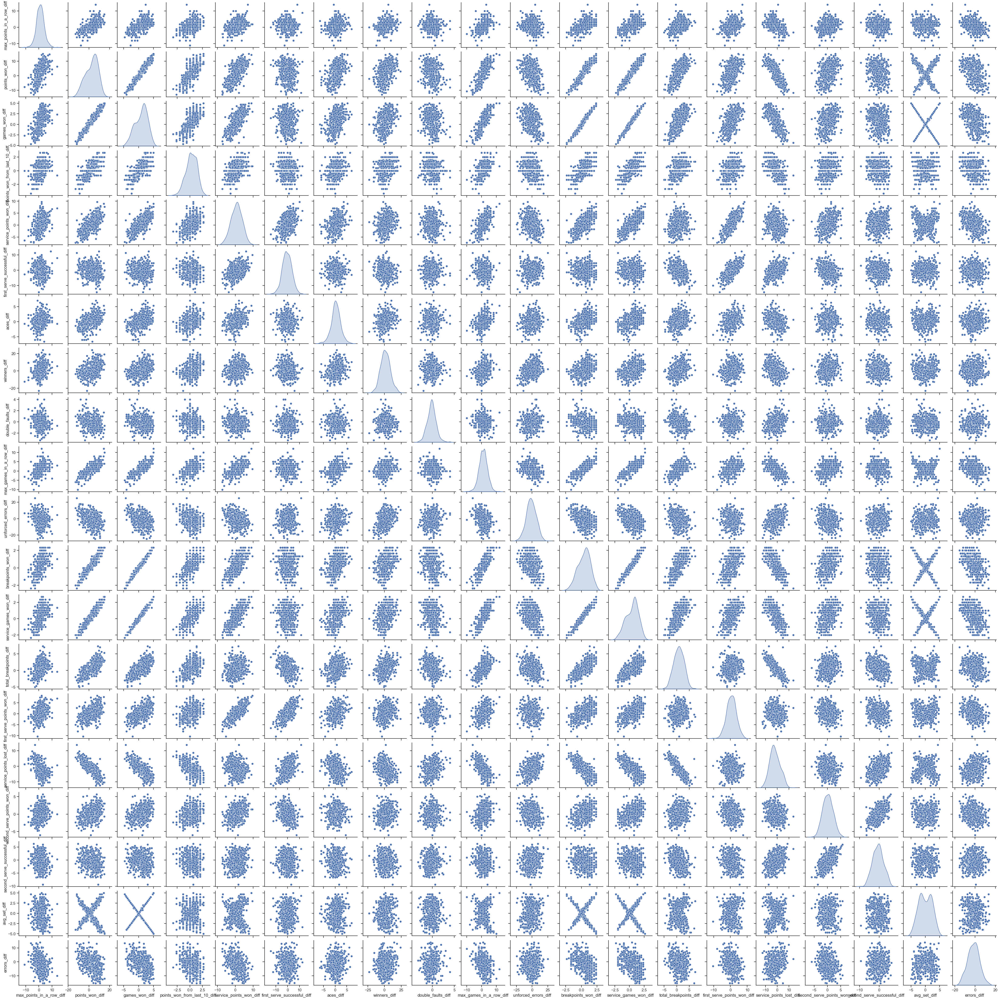

In [20]:
diff_only_m = diff_only[stats_df['men']]
sns.set(style="ticks")
sns.pairplot(diff_only_m, height=2, markers='o', diag_kind='kde')
# Show the plots
plt.show()

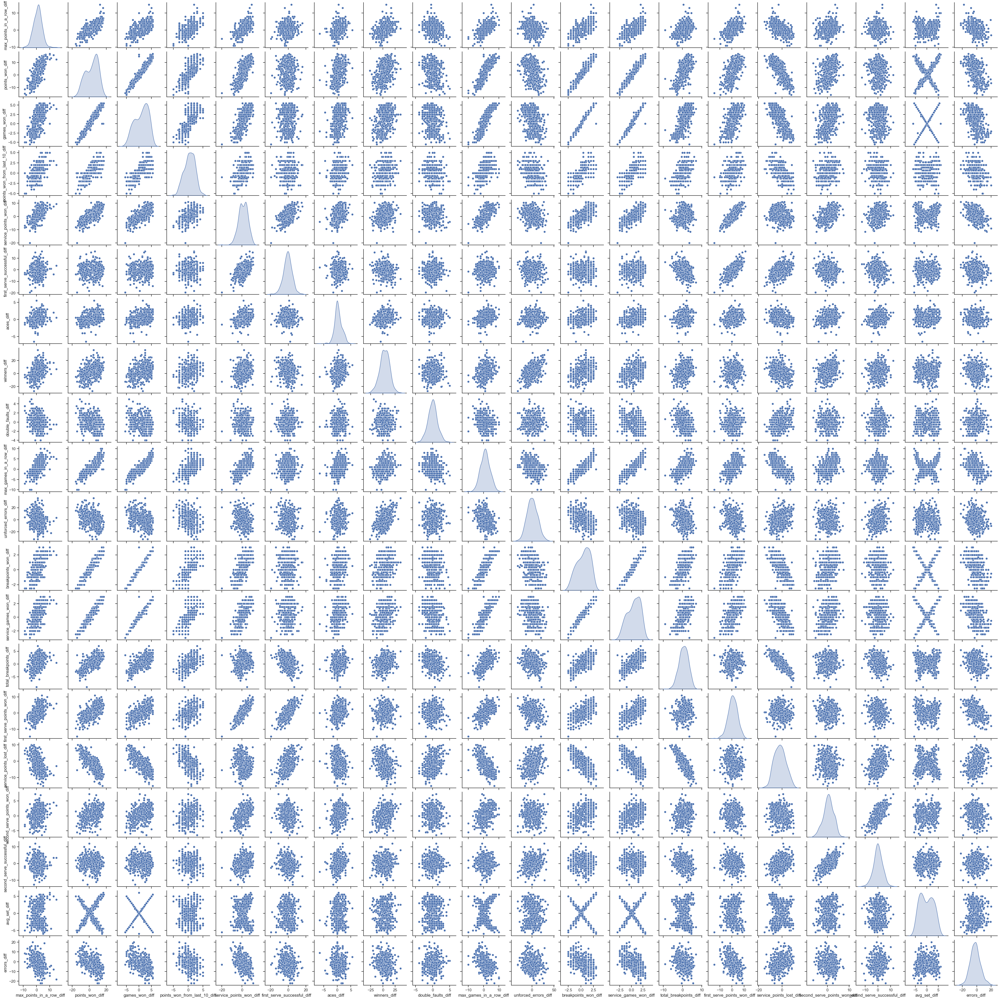

In [21]:
diff_only_w = diff_only[~stats_df['men']]
sns.set(style="ticks")
sns.pairplot(diff_only_w, height=2, markers='o', diag_kind='kde')
# Show the plots
plt.show()

In [47]:
def disp_scatter(df, var1, var2):

    sns.lmplot(x=var1, y=var2,data=df, hue='men', col = 'men', palette=['orange','skyblue'])
    #plt.suptitle(var1 + " VS " + var2, fontsize = 13)

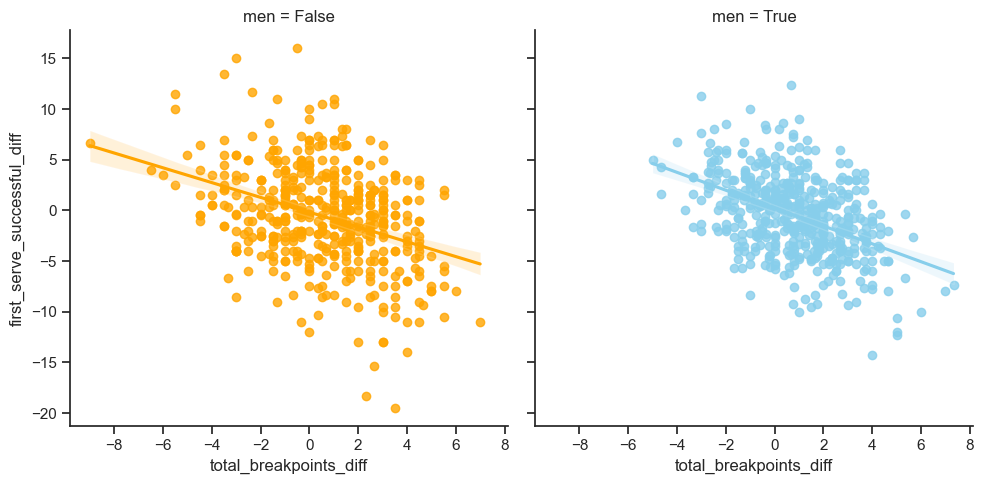

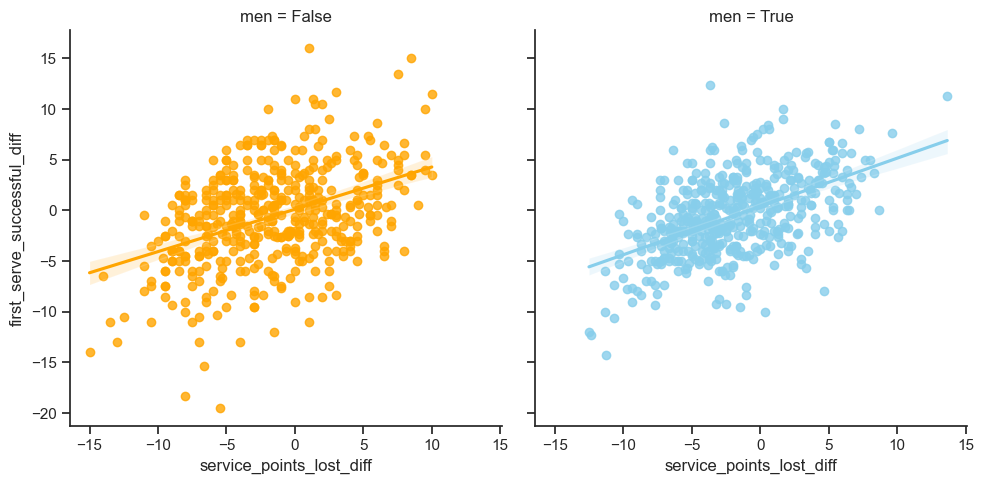

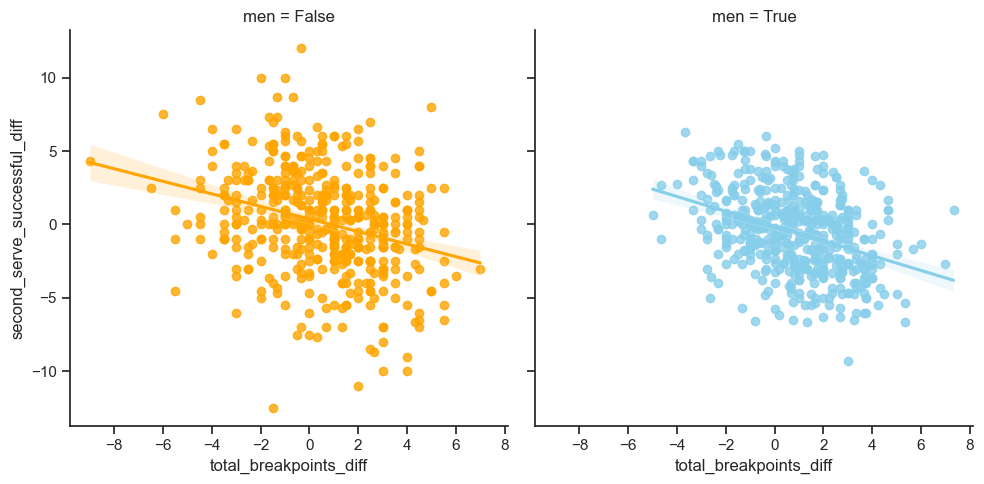

In [48]:
disp_scatter(stats_df, 'total_breakpoints_diff', 'first_serve_successful_diff')
disp_scatter(stats_df, 'service_points_lost_diff', 'first_serve_successful_diff')
disp_scatter(stats_df, 'total_breakpoints_diff', 'second_serve_successful_diff')